In [16]:
!pip install opencv-python

In [17]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow



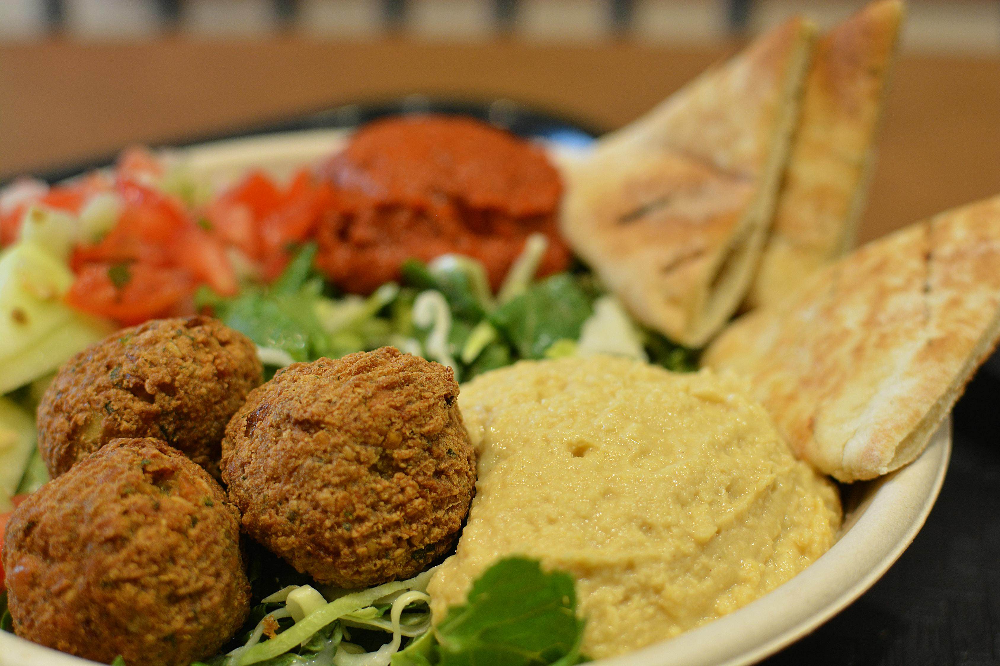

In [19]:
image = cv2.imread("flafel.jpeg")
cv2_imshow(image)

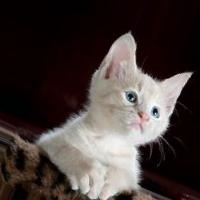

In [26]:
img = cv2.imread("/content/cat_0_3317.jpeg")
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [27]:
print(img.shape)

(200, 200, 3)


In [28]:
print("Height:" , img.shape[0], "pixels")
print("Width:" , img.shape[1], "pixels")

Height: 200 pixels
Width: 200 pixels


**Face and Eye Detection from Images using HAAR Cascade Classifier**

In [37]:
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

In [38]:
img = cv2.imread('/content/images.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [39]:
face = face_classifier.detectMultiScale(gray, 1.3, 5)

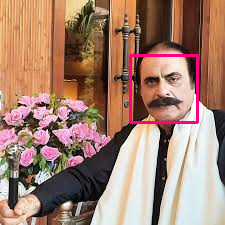

In [44]:
if len(face) == 0:  # Correct face detection check
    print("No faces found")
else:
    for (x, y, w, h) in face:
        cv2.rectangle(img, (x, y), (x + w, y + h), (127, 0, 255), 2)
        cv2_imshow(img)
        cv2.waitKey(0)
        # Region of interest for eyes
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = img[y:y + h, x:x + w]

        # Detect eyes
        eyes = eye_classifier.detectMultiScale(roi_gray)

        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (255, 255, 0), 2)

            cv2_imshow(img)

cv2.waitKey(0)
cv2.destroyAllWindows()


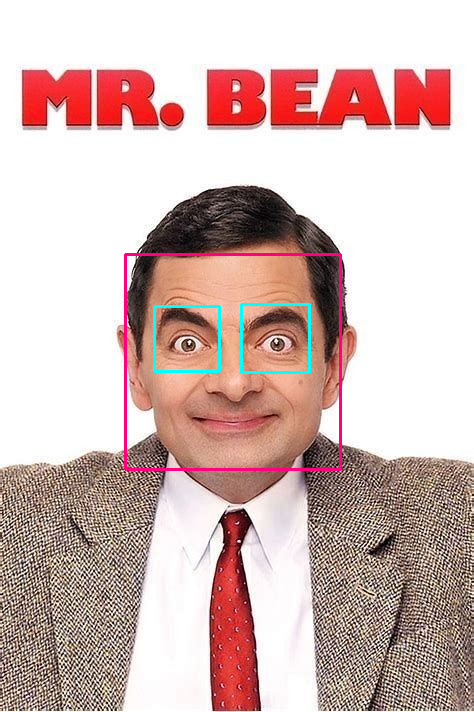

In [47]:
import cv2
from google.colab.patches import cv2_imshow  # For displaying in Colab

# Load classifiers
face_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
eye_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_eye.xml")

# Load the image
img = cv2.imread("/content/0a5b03246010045697acb482cab06732.jpg")  # Update with your image path
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_classifier.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

if len(faces) == 0:
    print("No faces detected")
else:
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x + w, y + h), (127, 0, 255), 2)  # Face rectangle

        # Region of interest for detecting eyes
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = img[y:y + h, x:x + w]

        # Detect eyes in the region of interest
        eyes = eye_classifier.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=5)

        if len(eyes) == 0:
            print("No eyes detected within the face region")
        else:
            for (ex, ey, ew, eh) in eyes:
                cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (255, 255, 0), 2)  # Eye rectangles

    # Show the final image
    cv2_imshow(img)

cv2.destroyAllWindows()
